# Домашнее задание 2

Дедлайн — ***6.09.18 12:00***. 

Выполненные задания можно присылать на почту zueva.nn@phystech.edu либо загружать в папку в своем репозитории.

В этом задании предлагается продолжить то, что мы начали делать на семинаре — принять участие в соревновании на платформе 'Kaggle'!

Мы будем работать с  уже знакомым нам соревнованием **House Prices: Advanced Regression Techniques**: 

https://www.kaggle.com/c/house-prices-advanced-regression-techniques

Задачей является предсказание цены дома по большому набору фич. Вам необходимо обучиться на `train.csv` и отправить свои предсказания для данных, которые лежат в `test.csv`. Все данные находятся в папке **Seminars/Seminar2**. Там же можно найти `baseline solutions` — базовые и простые решения без особых надстроек.


## Часть 1

1. Если вы еще не зарегистрированы на платформе `Kaggle`, то это можно сделать здесь: www.kaggle.com.
   Регистрация нужна для того, чтобы Ваши посылки были привязаны к конкретному аккаунту. 
2. После регистрации на ресурсе нужно стать участником соревнования: https://www.kaggle.com/c/house-prices-advanced-regression-techniques
3. После того, как вы зарегистрировались на участие в конкретном соревновании, вы готовы работать с данными. Обычно их можно скачать в разделе `Data`, но данные оттуда уже лежат в папке **Seminars/Seminar2**.

## Часть 2

Как только вы зарегистрировались и скачали данные, можно приступать к работе с ними.
1. Загрузите данные с помощью функций из пакета `Pandas` read_csv(). Обратите внимание на параметры — если у данных в первой строке стоят названия столбцов, то параметр **Header** нужно сделать истинным. Если данные вводятся через запятую, то параметру **sep** (separator) нужно передать символ `,`. Подробнее про параметры read_csv можно почитать здесь: https://pandas.pydata.org/pandas-docs/stable/generated/pandas.read_csv.html. Как видите, их очень много и чтение файла можно настроить очень тонко

### Импорт

In [98]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import pandas_profiling
from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from  sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error
import xgboost as xgb
from  sklearn.ensemble import RandomForestRegressor

class ColumnDesc:
    def __init__(self, df):
        self.numerical = np.array(df.dtypes[df.dtypes != np.object].index.tolist())
        self.categorical = np.array(df.dtypes[df.dtypes == np.object].index.tolist())
        
def prepare(data):
    ser = data.isnull().any()
    ser = ser[ser == True].index

    types = data.dtypes[ser]
    to_drop = ["Alley", "Fence", "MiscVal", "GarageCond"]#здесь список бесполезных по вашему мнению фичей]
    to_replace_to_none = ser

    for col in to_replace_to_none:
        if types[col] == np.object:
            val = "NaN"
        else:
            val =  data[col].min() - 1
        data[col].fillna(val, inplace=True)
    data.drop(to_drop, axis=1, inplace=True, errors="ignore")
    data.fillna(-1, inplace=True)
    return data

comparable_dict = {
    "Utilities": ['NaN','ELO', 'NoSeWa', 'NoSewr', 'AllPub'],
    "ExterQual": ['Po', 'Fa', 'TA', 'Gd', 'Ex'],
    "ExterCond": ['Po', 'Fa', 'TA', 'Gd', 'Ex'],
    "BsmtQual": [ "NaN",'Po', 'Fa', 'TA', 'Gd', 'Ex'],
    "BsmtCond":  [ "NaN",'Po', 'Fa', 'TA', 'Gd', 'Ex'],
    "BsmtExposure": ['NaN', 'No', 'Mn', 'Av', 'Gd'],
    "BsmtFinType1": ['NaN', 'Unf', 'LwQ', 'Rec', 'BLQ', 'ALQ', 'GLQ'], 
    "BsmtFinType2": ['NaN', 'Unf', 'LwQ', 'Rec', 'BLQ', 'ALQ', 'GLQ'],
    "HeatingQC": ['Po', 'Fa', 'TA', 'Gd', 'Ex'],
    "KitchenQual": ['NaN','Po', 'Fa', 'TA', 'Gd', 'Ex'],
    "FireplaceQu": ['NaN', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],
    "GarageQual": ['NaN', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],
    "GarageCond": ['NaN', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],
    "PavedDrive": ['N', 'P', 'Y'],
    "PoolQC":['NaN', 'Fa', 'TA', 'Gd', 'Ex'],
    "Fence": ['NaN', 'MnWw', 'GdWo', 'MnPrv', 'GdPrv']
}

for key, value in comparable_dict.items():
    temp_dict = {q: ind for ind, q in enumerate(value)}
    comparable_dict[key] = temp_dict
    
def submit(preds):
    submission = pd.read_csv("sample_submission.csv")
    submission["SalePrice"] = preds
    submission.to_csv("submission.csv", index=False)
def code_freq(data, col):
    return data[col].map(data.groupby(col).count().iloc[:, 0] / data.shape[0])

def test_model(model, X, Y):
    cache = []
    def score_function(estim, X, y):
        y_pred = estim.predict(X)
        val = mean_squared_error(y, y_pred)
        cache.append(val)
        return 1 / val
    cross_val_score(model, X, Y, scoring=score_function)
    return np.mean(cache)

### Загрузка данных

In [2]:
train = pd.read_csv("train.csv")

test = pd.read_csv("test.csv")

labels = train["SalePrice"]
train.drop("SalePrice", inplace=True, axis=1)

С какими типами признаков вы столкнулись?


Ответ: Количественные и номинальные.

## Часть 3
Какие признаки выглядят бесполезными? Попробуйте выбросить некоторые фичи, опираясь на ваш личный жизненный опыт или алгоритмы `feature selection`. Подробнее про них можно прочитать здесь: http://scikit-learn.org/stable/modules/feature_selection.html

### Анализ

In [3]:
both_df = pd.concat([train, test])

In [57]:
pandas_profiling.ProfileReport(both_df)

Number of variables,81
Number of observations,2919
Total Missing (%),5.9%
Total size in memory,1.8 MiB
Average record size in memory,648.0 B
Numeric,38
Categorical,43
Date,0
Text (Unique),0
Rejected,0
Distinct count,1083


GarageCond is highly correlated with GarageQual (ρ = 0.94666) Rejected

Заменим порядковые категории числами для удобства сравнения

In [4]:
both_df = prepare(both_df)
ids_ser = both_df["Id"]
both_df.drop("Id", axis=1, inplace=True)

for col, new_val in comparable_dict.items():
    if col in both_df:
        both_df[col] = both_df[col].map(new_val)
    
column_desc = ColumnDesc(both_df)

Векторизуем все номинальные поля

In [5]:
for col in column_desc.categorical:
    ohe = LabelBinarizer()
    vectors = ohe.fit_transform(both_df[col])
    class_list = ohe.classes_
    if vectors.shape[1] == 1:
        both_df[col] = vectors
    else:
        del both_df[col]
        for ind, cl_name in enumerate(class_list):
            both_df[col + "_" + cl_name] = vectors[:, ind]

In [20]:
both_df.head()

,MSSubClass,LotFrontage,LotArea,Street,Utilities,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,...,SaleType_ConLw,SaleType_NaN,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal
0,60,65.0,8450,1,4,7,5,2003,2003,196.0,...,0,0,0,0,1,0,0,0,0,1
1,20,80.0,9600,1,4,6,8,1976,1976,0.0,...,0,0,0,0,1,0,0,0,0,1
2,60,68.0,11250,1,4,7,5,2001,2002,162.0,...,0,0,0,0,1,0,0,0,0,1
3,70,60.0,9550,1,4,7,5,1915,1970,0.0,...,0,0,0,0,1,1,0,0,0,0
4,60,84.0,14260,1,4,8,5,2000,2000,350.0,...,0,0,0,0,1,0,0,0,0,1


Проверим ещй раз наши данные

In [32]:
pandas_profiling.ProfileReport(both_df)

Number of variables,239
Number of observations,2919
Total Missing (%),0.0%
Total size in memory,3.2 MiB
Average record size in memory,1.1 KiB
Numeric,233
Categorical,0
Date,0
Text (Unique),0
Rejected,6
Distinct count,1083


Появилась корреляция. Не будем долго думать, удалим лишнее

In [6]:
drop_col = ["Exterior2nd_CmentBd", "Exterior2nd_MetalSd", "Exterior2nd_NaN", "Exterior2nd_VinylSd", "GarageFinish_NaN", "SaleCondition_Partial"]
for col in drop_col:
    del both_df[col]

### Графики

Какие фичи кажутся вам самыми значимыми? Оцените значимость признаков, опираясь на описанный выше алгоритм, либо на ваш личный опыт, постройте для трех самых значимых графики. Как распределены данные? По какому закону?

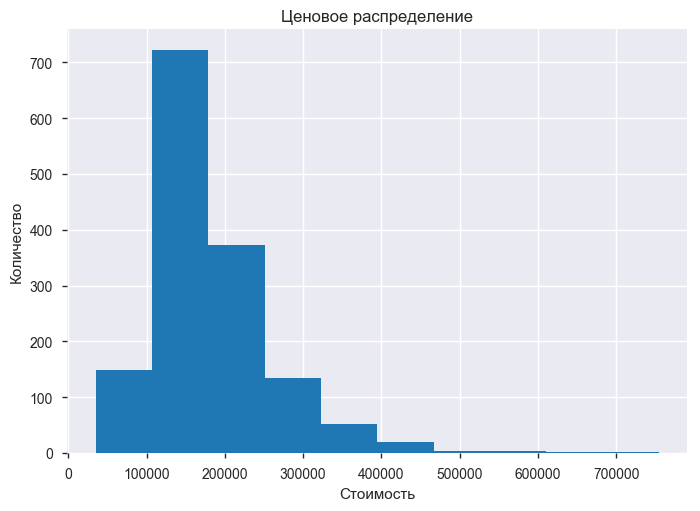

In [41]:
labels.hist()
plt.xlabel("Стоимость")
plt.ylabel("Количество")
plt.title("Ценовое распределение")
plt.show()

In [9]:
square = both_df[:train.shape[0]]["1stFlrSF"] + both_df[:train.shape[0]]["2ndFlrSF"]

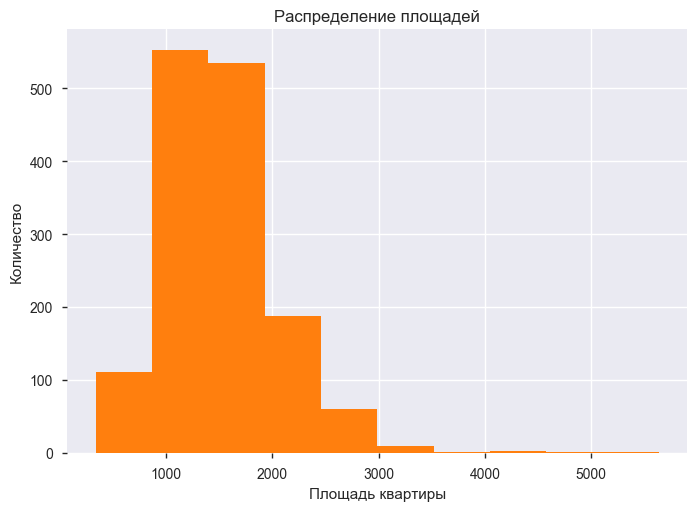

In [53]:
square.hist()
plt.xlabel("Площадь квартиры")
plt.ylabel("Количество")
plt.title("Распределение площадей")
plt.show()

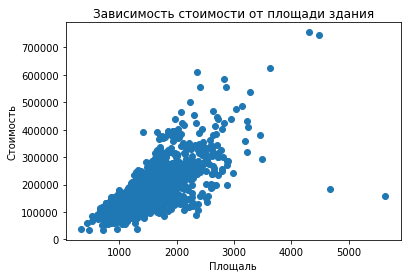

In [15]:
plt.scatter(square, labels)
plt.title("Зависимость стоимости от площади здания")
plt.xlabel("Площаль")
plt.ylabel("Стоимость")
plt.show()

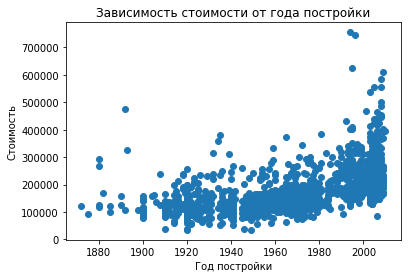

In [14]:
plt.scatter(both_df[:train.shape[0]]["YearBuilt"], labels)
plt.title("Зависимость стоимости от года постройки")
plt.xlabel("Год постройки")
plt.ylabel("Стоимость")
plt.show()

Посмотрим зависимость цены от сущестующих полей

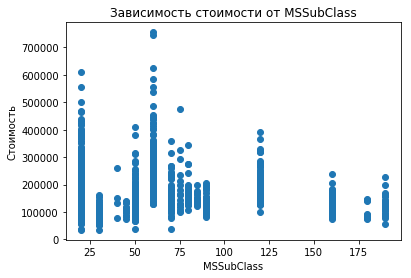

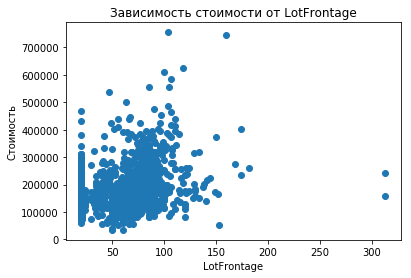

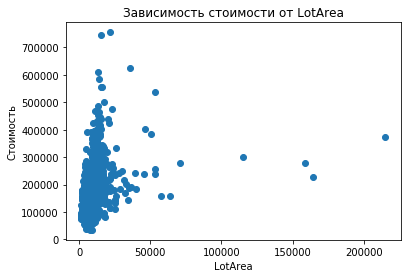

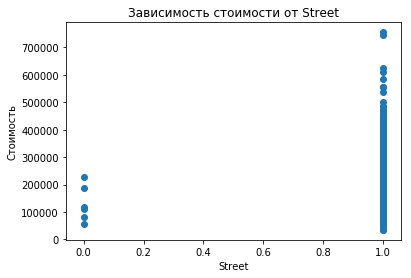

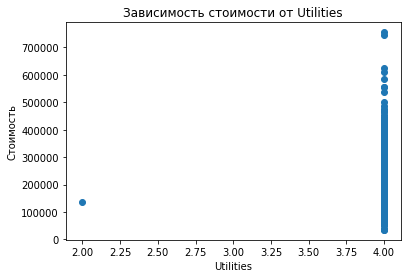

...

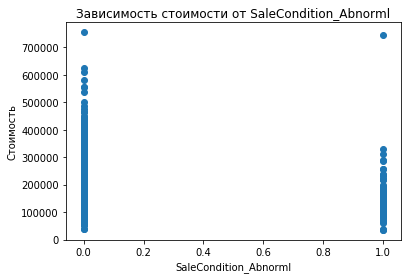

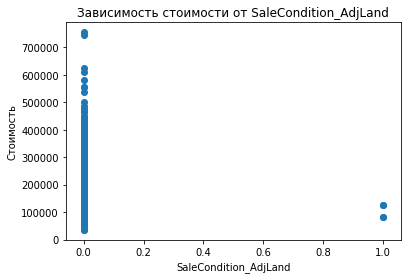

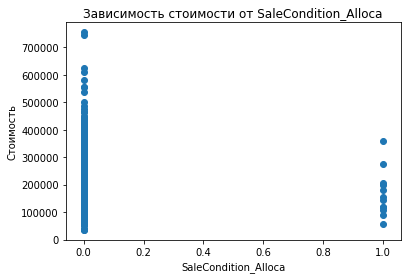

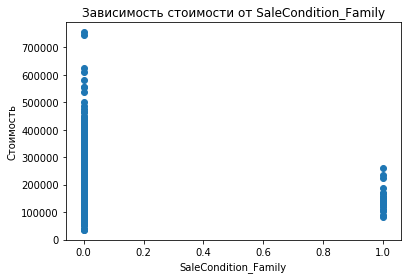

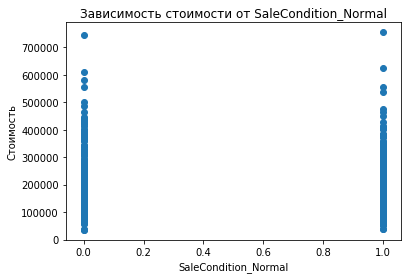

In [21]:
for col in both_df.columns:
    plt.scatter(both_df[:train.shape[0]][col], labels)
    plt.title(f"Зависимость стоимости от {col}")
    plt.xlabel(col)
    plt.ylabel("Стоимость")
    plt.show()

**Итог**: За отведённое время feature engineering не увенчался успехом. Будем работать с тем что есть.

Попробуйте запустить обучение на разных алгоритмах (пример запуска в семинарах):
1. Линейная регрессия http://scikit-learn.org/stable/auto_examples/linear_model/plot_ols.html
2. Решающее дерево http://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeRegressor.html
3. Случайный лес http://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html
4. Градиентный бустинг http://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingRegressor.html

И любые другие модели, которые покажутся вам интересными :)

P.S.не забудьте использовать **cross_validation** и **K-Fold!**
Также можно распараллелить процесс обучения, если параметру *n_jobs* в регрессор передать значение *-1*.
С помощью  *cross_val_score* можно оценивать качество построенной модели.
Также у каждого регрессора есть множество *параметров*. Подробно про них можно прочитать в документации http://scikit-learn.org

Пример запуска модели можно найти в **Seminars/Seminar2**.

### Обучение

In [183]:
X = both_df[:train.shape[0]]
X_test = both_df[train.shape[0]: ]
Y = np.log1p(labels)

#### GradientBoostingRegressor

In [100]:
rmse = test_model(GradientBoostingRegressor(), X, Y)
print(f"RMSE: {rmse}")

RMSE: 0.01620101082142619


In [97]:
regr = GradientBoostingRegressor()
regr.fit(X, Y)
preds = regr.predict(X_test)
submit(np.expm1(preds))

#### XGBoost

In [120]:
def score_function_xg(y_pred, dtrain):
    y = dtrain.get_label()
    val = mean_squared_error(y, y_pred)
    return 'RMSE',  val

In [121]:
xgtrain = xgb.DMatrix(X.values, Y)
xgtest = xgb.DMatrix(X_test.values)

In [124]:
param = {"max_depth": 60,
        "silent": 1}
hist_df = xgb.cv(param, xgtrain, feval=score_function_xg, maximize=False, num_boost_round=40)
hist_df

,test-RMSE-mean,test-RMSE-std,test-rmse-mean,test-rmse-std,train-RMSE-mean,train-RMSE-std,train-rmse-mean,train-rmse-std
0,65.290560,0.130172,8.080253,0.008053,6.529060e+01,4.265434e-02,8.080259,0.002640
1,32.105057,0.098234,5.666126,0.008664,3.209536e+01,2.033622e-02,5.665276,0.001795
2,15.809047,0.069816,3.976050,0.008780,1.579609e+01,1.043943e-02,3.974429,0.001313
3,7.794807,0.039323,2.791909,0.007038,7.791023e+00,5.583110e-03,2.791240,0.001000
4,3.860417,0.022649,1.964786,0.005761,3.854547e+00,3.399897e-03,1.963300,0.000866
5,1.916462,0.014309,1.384354,0.005172,1.914778e+00,2.157748e-03,1.383755,0.000780
6,0.960293,0.011781,0.979927,0.006013,9.571500e-01,1.445317e-03,0.978340,0.000739
7,0.490213,0.008807,0.700124,0.006301,4.832907e-01,1.446214e-03,0.695190,0.001040
8,0.256955,0.006918,0.506861,0.006848,2.472320e-01,1.311786e-03,0.497223,0.001319
9,0.141403,0.005406,0.375966,0.007239,1.288853e-01,1.006568e-03,0.359003,0.001402


In [125]:
bst = xgb.train(param, xgtrain, feval=score_function_xg, maximize=False, num_boost_round=40)
preds = bst.predict(xgtest)
submit(np.expm1(preds))

#### RandomForest

In [103]:
rmse = test_model(RandomForestRegressor(n_estimators=200), X, Y)
print(f"RMSE: {rmse}")

RMSE: 0.021240368937765115


In [30]:
est = RandomForestRegressor(n_estimators=200)
est.fit(X, Y)
preds = est.predict(X_test)
submit(np.expm1(preds))

#### Keras

In [124]:
from keras.models import Sequential
from keras.layers import Dense
import tensorflow as tf
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split

def rmse_loss(y_true, y_pred):
    val = tf.losses.mean_squared_error(y_true, y_pred)
    return tf.sqrt(val)

In [151]:
colums = ["MSSubClass", "1stFlrSF", "2ndFlrSF", "OverallQual", "KitchenQual", "GarageCars"]

In [184]:
X_np = X[colums].as_matrix()
X_test_np = X_test[colums].as_matrix()
Y_np = Y.as_matrix()

In [194]:
model = Sequential()
model.add(Dense(units=10, activation='linear', input_dim=X_np.shape[1]))
model.add(Dense(units=1, activation='linear'))
model.compile(loss=rmse_loss,
              optimizer='Adagrad',
              metrics=[rmse_loss])

In [187]:
X_train, X_val, y_train, y_val = train_test_split(X_np, Y_np, test_size=0.1, random_state=44)

In [ ]:
model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_val, y_val))

In [ ]:
model.fit(X_np, Y_np, epochs=4000, batch_size=32)

In [197]:
preds = model.predict(X_test_np)
submit(np.expm1(preds))

### Часть 4
После того, как вы сформировали файл `submission.csv`, он появится в той же директории, где находится основной Jupyter Notebook. Далее его необходимо отправить в систему. Для этого нужно нажать на `Submit Predictions`.
Далее вы нажиматее `Upload Submission File` и отправляете туда `submission.csv` (сам код отправлять в этом соревновании не нужно!). После того, как Вы нажали `Submit`, Kaggle перенаправит вас на *Leader board*, где вы сможете увидеть свой *score* и место среди всех участников.
Будьте внимательны, нельзя делать больше 10 посылок в день!

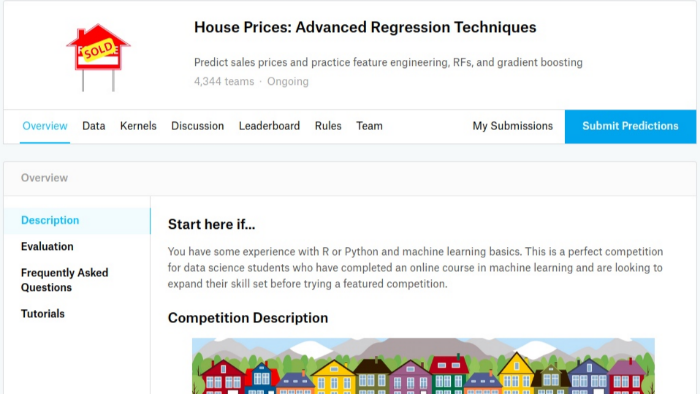

In [16]:
from IPython.display import Image
Image("1.png")

Идеи, как можно улучшить результат:
* Найти какие категориальные признаки являются ординальными и закодировать их соответственно
* Найти наиболее важные категориальные признаки и попробовать их закодировать разными способами
* Потюнить регрессор
* Сгенерировать новые признаки

### Часть 4
Опишите полученные результаты, какого скора Вы смогли добиться, какое место заняли? Какой алгоритм оказался лучше других? Можете ли Вы объяснить, почему так вышло?

Ответ:

В результате тестирования разных моделей, лучший результат был достигнут на градиентном бустинге. Данный метод позволил получить оценку в 0.13448 и занят 1828 место. Не исключено, что если задаться вопросом тюнинга параметров можно ещё выжать из модели. При сравнении с его конкурентом - случайным лесом, сложно сказать, что позволило первому вырваться вперёд.
В работе хочется отметить модель - полносвязныю нейронную сеть. Имея всего 1400 примеров удалось натренировать модель и получит score 0.17 на kaggle, что уже близко к бустингу.